LOADING DATA

CHECKING IF THE ALL THE IMAGES WERE UNZIPPED, COUNTING THEM

In [ ]:
#Counting images
import glob
from PIL import Image, ImageOps

img_count = 0

for im_path in glob.glob("/content/data/*.png"):
    img_count += 1

print("Number of images unzipped:", img_count)

Number of images unzipped: 9529


CONVERTING IMAGES INTO NUMPY ARRAY

In [ ]:
#Creating new folder with images that will be stored in numpy array
from PIL import Image
import numpy as np
import os

# Name of a new folder that will be made
new_folder_name = "new_data"

# Path to a new folder in /content
new_folder_path = os.path.join("/content", new_folder_name)

# Creating new folder if it doesnt exist
os.makedirs(new_folder_path, exist_ok=True)

# Path to a folder with .png images
folder_path = "/content/data"

# List of images
images = []

# Converting all the files in a folder
for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
        # Loading an image and converting it to a grayscale image
        img = Image.open(os.path.join(folder_path, filename)).convert('L')

        # Numpy array convertion
        img_array = np.array(img)

        # Adding an image to an array
        images.append(img_array)

# Converting list to an array
images = np.array(images)

# Saving data to previously created folder
np.save(os.path.join(new_folder_path, 'images.npy'), images)

SPLITTING IMAGES INTO TRAIN,TEST AND VALIDATION SETS

In [ ]:
#Creating training and test datasets from array
from sklearn.model_selection import train_test_split

# Reading data from a file
images = np.load('/content/new_data/images.npy')

# Preparing data - normalization of pixel values to the range [0, 1]
images = images.astype('float32') / 255.0

# Splitting data into a training and validation sets (80% train, 20% validation)
train_images, val_images = train_test_split(images, test_size=0.2, random_state=42)

# # Further splitting validation set into validation and test sets (50% validation, 50% test)
# val_images, test_images = train_test_split(val_images, test_size=0.5, random_state=42)


CHECKING SHAPES OF SETS

In [ ]:
#Importing libraries
from tensorflow.keras.layers import Dense, Input, Flatten,\
                                    Reshape, LeakyReLU as LR,\
                                    Activation, Dropout
from tensorflow.keras.models import Model, Sequential
from matplotlib import pyplot as plt
from IPython import display # If using IPython, Colab or Jupyter
import numpy as np

In [ ]:
# Using previously saved data
(x_train, x_val) = train_images, val_images
y_train, y_val = None, None  # In case of using labels

# Checking the dimensions of the data
print("x_train shape:", x_train.shape)
print("x_val shape:", x_val.shape)

x_train shape: (7623, 30, 25)
x_val shape: (1906, 30, 25)


PLOTTING IMAGES FROM BOTH SETS TO CHECK THEM

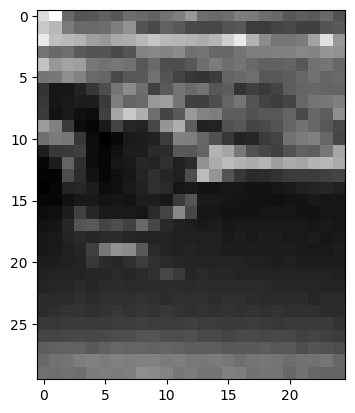

In [ ]:
# Plotting image data from x_train
plt.imshow(x_train[0], cmap = "gray")
plt.show()

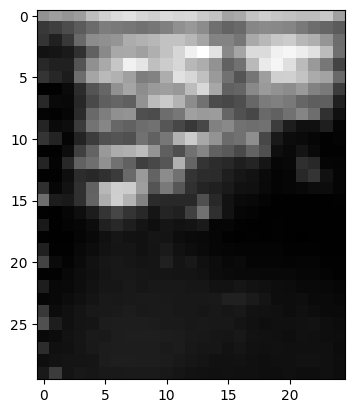

In [ ]:
# Plotting image data from x_test
# plt.imshow(x_test[0], cmap = "gray")
# plt.show()

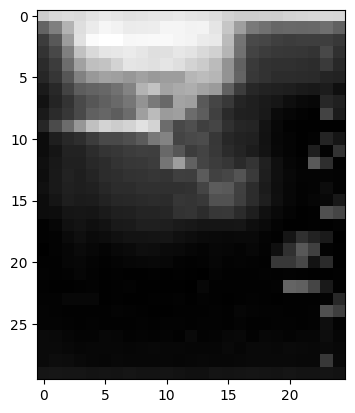

In [ ]:
# Plotting image data from x_val
plt.imshow(x_val[0], cmap = "gray")
plt.show()

CREATING AUTOENCODER

In [ ]:
#CONVOLUTIONAL AUTOENCODER LIBRARIES
from keras.models import Sequential
from keras.layers import Dense, Flatten, Reshape, Conv2D, MaxPooling2D, UpSampling2D
from keras.layers import Cropping2D
from keras.layers import Lambda

In [ ]:
#LATENT SIZE
LATENT_SIZE = 64

In [ ]:
# Encoder
encoder = Sequential([
    Conv2D(128, (3, 3), activation='relu', padding='same', input_shape=(30, 25, 1)),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    Flatten(),
    Dense(LATENT_SIZE, activation='relu')
])

# Decoder
decoder = Sequential([
    Dense(1200, activation='relu', input_shape=(LATENT_SIZE,)),
    Reshape((4, 5, 60)),
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(1, (3, 3), activation='sigmoid', padding='same'),
    Lambda(lambda x: x[:, :30, :25, :])
])


In [ ]:
# Combine encoder and decoder to create the autoencoder
autoencoder = Sequential([encoder, decoder])

In [ ]:
# Compile the model in this case MSE works better than the categorical_crossentropy
autoencoder.compile(optimizer='adam', loss='mse')

In [ ]:
# Display the model summary
autoencoder.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 64)                114608    
                                                                 
 sequential_1 (Sequential)   (None, 30, 25, 1)         184801    
                                                                 
Total params: 299409 (1.14 MB)
Trainable params: 299409 (1.14 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


GPU


In [ ]:
import tensorflow as tf

# Check if a GPU is available
if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print('No GPU detected. Make sure to enable the GPU in the Colab runtime settings.')


Default GPU Device: /device:GPU:0


TRAINING THE AUTOENCODER


In [ ]:
#Number of EPOCHS
EPOCHS = 60

In [ ]:
pip install livelossplot

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from IPython import display  # If you're using IPython for displaying
import os
from tensorflow.keras.callbacks import EarlyStopping
from livelossplot import PlotLossesKeras

In [ ]:
# Directory to save encoded and decoded images
save_dir_encoded = "/content/encoded"
os.makedirs(save_dir_encoded, exist_ok=True)

In [ ]:
# Initialize lists to store all encoded and decoded images
all_encoded_images = []

In [ ]:
# Extract the encoder part from the autoencoder
encoder = autoencoder.layers[0]

In [ ]:
# Define Early Stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [ ]:
plot_losses = PlotLossesKeras()

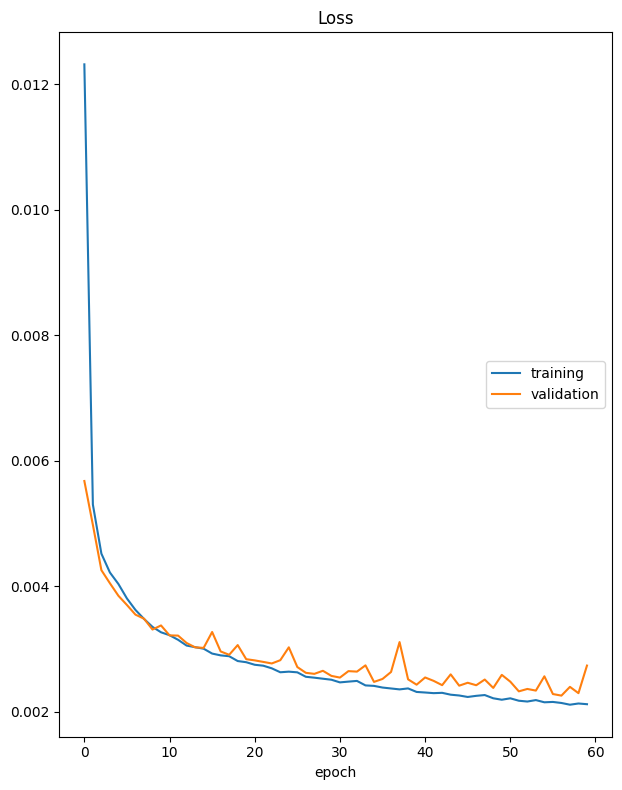

Loss
	training         	 (min:    0.002, max:    0.012, cur:    0.002)
	validation       	 (min:    0.002, max:    0.006, cur:    0.003)
239/239 [==============================] - 4s 18ms/step - loss: 0.0021 - val_loss: 0.0027


In [ ]:
# Train the autoencoder with live loss plotting
history = autoencoder.fit(train_images, train_images, epochs=EPOCHS, shuffle=True,
                          validation_data=(val_images, val_images), callbacks=[plot_losses, early_stopping])

In [ ]:
# Encode a separate set of data for saving compressed representations
encoded_images = encoder.predict(x_train)

239/239 [==============================] - 0s 2ms/step


In [ ]:
# Save the NumPy array for encoded images
np.save(os.path.join(save_dir_encoded, f"encoded_images.npy"), encoded_images)

DISPLAYING RANDOM COMPRESSED IMAGE AND CHECKING ITS SIZE FOR FURTHER ANALYSIS

In [ ]:
# Directory where encoded images are saved
encoded_dir = "/content/encoded"

In [ ]:
# Specify the epoch number
epoch_number = 59

In [ ]:
# Load the encoded images from the file
encoded_file_path = os.path.join(encoded_dir, f"encoded_images.npy")

Loaded compressed images from epoch 59.
Shape of Random Compressed Image: (64,)


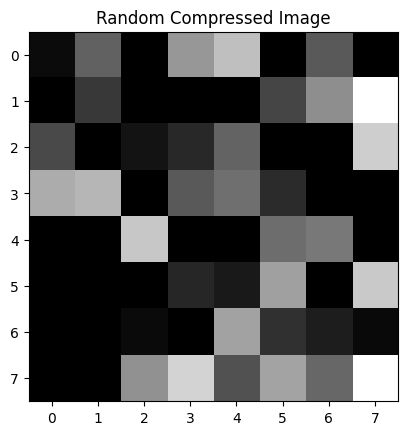

In [ ]:
if os.path.exists(encoded_file_path):
    encoded_images_epoch = np.load(encoded_file_path, allow_pickle=True)
    print(f"Loaded compressed images from epoch {epoch_number}.")

    # Choose a random index
    random_index = np.random.randint(0, encoded_images_epoch.shape[0])

    # Get the random encoded image
    random_encoded_image = encoded_images_epoch[random_index]

    # Print the shape of the random encoded image
    print(f"Shape of Random Compressed Image: {random_encoded_image.shape}")

    # Plot the random encoded image
    plt.imshow(random_encoded_image.reshape(8, 8), cmap='gray')
    plt.title('Random Compressed Image')
    plt.show()
else:
    print(f"File not found: {encoded_file_path}")


PLOTTING RANDOM IMAGES(ORIGINAL, COMPRESSED, DECODED)

In [ ]:
# Assuming x_test is your original data
test_size = len(x_train)

In [ ]:
# Choose 20 random indices from x_test
rand_indices = np.random.randint(0, test_size, 20)

1/1 [==============================] - 0s 17ms/step


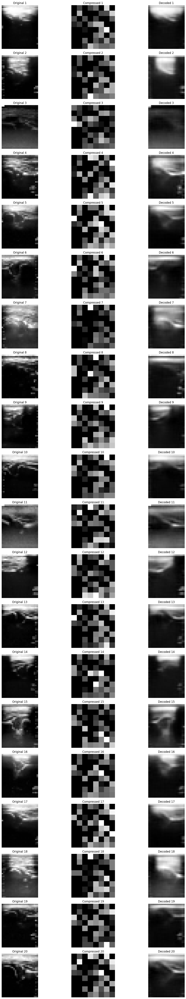

In [ ]:
# Plot 20 random images
fig, axs = plt.subplots(20, 3, figsize=(15, 60))

for i, rand_index in enumerate(rand_indices):
    original_image = x_train[rand_index]

    # Reshape for prediction
    original_image_reshaped = original_image.reshape((1, 30, 25, 1))

    # Get the encoded image directly from the encoder
    encoded_image = autoencoder.layers[0].predict(original_image_reshaped)

    # Decode the image using the decoder part of the autoencoder
    decoded_image = autoencoder.layers[1].predict(encoded_image)

    # Plot the original, encoded, and decoded images for each example
    axs[i, 0].imshow(original_image, cmap="gray")  # Use original_image directly
    axs[i, 0].axis("off")
    axs[i, 0].set_title(f"Original {i+1}")

    axs[i, 1].imshow(encoded_image.reshape((8, 8)), cmap="gray")
    axs[i, 1].axis("off")
    axs[i, 1].set_title(f"Compressed {i+1}")

    axs[i, 2].imshow(decoded_image[0, :, :, 0], cmap="gray")
    axs[i, 2].axis("off")
    axs[i, 2].set_title(f"Decoded {i+1}")

plt.tight_layout()
plt.show()


ELBOW METHOD TO DETERMINE THE NUMBER OF CLUSTERS

In [ ]:
print(encoded_images_epoch.shape)

(7623, 64)


In [ ]:
from sklearn.cluster import KMeans

In [ ]:
# Directory where compressed images are saved
encoded_dir = "/content/encoded"

In [ ]:
# Load the encoded images from epoch
epoch_number = 59
encoded_file_path = os.path.join(encoded_dir, f"encoded_images.npy")

Loaded compressed images from epoch 59.


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

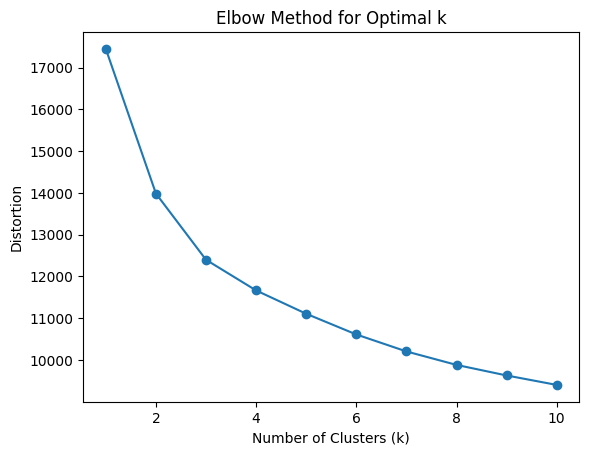

In [ ]:
#PLOT THE ELBOW METHOD
if os.path.exists(encoded_file_path):
    encoded_images_epoch = np.load(encoded_file_path)
    print(f"Loaded compressed images from epoch {epoch_number}.")

    # Reshape each encoded image to 2D (flatten each image into a vector)
    encoded_images_flat = encoded_images_epoch.reshape((-1, encoded_images_epoch.shape[1]))

    # Use the elbow method to find the optimal number of clusters
    distortions = []
    K_range = range(1, 11)  # Adjust the range based on your preferences
    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(encoded_images_flat)
        distortions.append(kmeans.inertia_)

    # Plot the elbow curve
    plt.plot(K_range, distortions, marker='o')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Distortion')
    plt.title('Elbow Method for Optimal k')
    plt.show()

else:
    print(f"File not found: {encoded_file_path}")

In [ ]:
print(f"Shape of encoded_images_epoch: {encoded_images_epoch.shape}")


Shape of encoded_images_epoch: (7623, 64)


KMEANS CLUSTERING



In [ ]:
# Directory where encoded and decoded images are saved
encoded_dir = "/content/encoded"

In [ ]:
# Load the encoded and decoded images from epoch 59
epoch_number = 59
encoded_file_path = os.path.join(encoded_dir, f"encoded_images.npy")

In [ ]:
# Load the encoded images
encoded_images = np.load(encoded_file_path)

# Number of clusters
num_clusters = 4

# Initialize KMeans model
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit the KMeans model to the encoded images
kmeans.fit(encoded_images)

# Get cluster assignments for each encoded image
cluster_assignments = kmeans.predict(encoded_images)

# Print the cluster assignments
print("Cluster Assignments:")
print(cluster_assignments)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster Assignments:
[3 0 3 ... 0 2 1]


TSNE 2D VISUALISATION OF ENCODED IMAGES KMEANS

In [ ]:
from sklearn.manifold import TSNE
import pandas as pd
import plotly.express as px

In [ ]:
# Function to visualize 2D t-SNE plot using Plotly
def visualize_tsne_2d(data, cluster_labels, title, perplexity_value):
    tsne = TSNE(n_components=2, perplexity=perplexity_value, random_state=42)
    embedded_data = tsne.fit_transform(data)

    # Create a DataFrame for Plotly
    df = pd.DataFrame(data=embedded_data, columns=['T-SNE Dimension 1', 'T-SNE Dimension 2'])
    df['Cluster Labels'] = cluster_labels

    # Plot 2D scatter plot using Plotly
    fig = px.scatter(df, x='T-SNE Dimension 1', y='T-SNE Dimension 2', color='Cluster Labels',
                     opacity=0.5, title=f"{title} (Perplexity={perplexity_value})")

    fig.update_layout(xaxis_title='T-SNE Dimension 1', yaxis_title='T-SNE Dimension 2')
    fig.show()


In [ ]:
# Load the encoded images
encoded_images = np.load(encoded_file_path)

#Subsample to x points
subsampled_indices = np.random.choice(encoded_images.shape[0], size=7500, replace=False)
encoded_images_subsampled = encoded_images[subsampled_indices]

# Number of clusters
num_clusters = 4

# Initialize KMeans model
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit the KMeans model to the encoded images
kmeans.fit(encoded_images_subsampled)

# Get cluster assignments for each encoded image
cluster_assignments = kmeans.predict(encoded_images_subsampled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
perplexity_values = [5, 15, 20, 30, 52, 77, 92]

In [ ]:
for perplexity in perplexity_values:
    visualize_tsne_2d(encoded_images_subsampled, cluster_assignments, "t-SNE Visualization for KMeans Clustering", perplexity_value=perplexity)

TSNE 3D VISUALISATION OF ENCODED IMAGES KMEANS

In [ ]:
# Function to visualize 3D t-SNE plot using Plotly
def visualize_tsne_3d(data, cluster_labels, title, perplexity_value):
    tsne = TSNE(n_components=3, perplexity=perplexity_value, random_state=42)
    embedded_data = tsne.fit_transform(data)

    # Create a DataFrame for Plotly
    df = pd.DataFrame(data=embedded_data, columns=['T-SNE Dimension 1', 'T-SNE Dimension 2', 'T-SNE Dimension 3'])
    df['Cluster Labels'] = cluster_labels

    # Plot 3D scatter plot using Plotly
    fig = px.scatter_3d(df, x='T-SNE Dimension 1', y='T-SNE Dimension 2', z='T-SNE Dimension 3',
                        color='Cluster Labels', opacity=0.5, title=f"{title} (Perplexity={perplexity_value})")

    fig.update_layout(scene=dict(xaxis_title='T-SNE Dimension 1', yaxis_title='T-SNE Dimension 2', zaxis_title='T-SNE Dimension 3'))
    fig.show()

In [ ]:
# Load the encoded images
encoded_images = np.load(encoded_file_path)

# Subsample to x points
subsampled_indices = np.random.choice(encoded_images.shape[0], size=7500, replace=False)
encoded_images_subsampled = encoded_images[subsampled_indices]

# Number of clusters
num_clusters = 4

# Initialize KMeans model
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# Fit the KMeans model to the encoded images
kmeans.fit(encoded_images_subsampled)

# Get cluster assignments for each encoded image
cluster_assignments = kmeans.predict(encoded_images_subsampled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
perplexity_values = [5, 15, 20, 30, 52, 77, 92]

In [ ]:
for perplexity in perplexity_values:
    visualize_tsne_3d(encoded_images_subsampled, cluster_assignments, "t-SNE Visualization for KMeans Clustering", perplexity_value=perplexity)

PLOTTING IMAGE FROM EVERY CLUSTER KMEANS

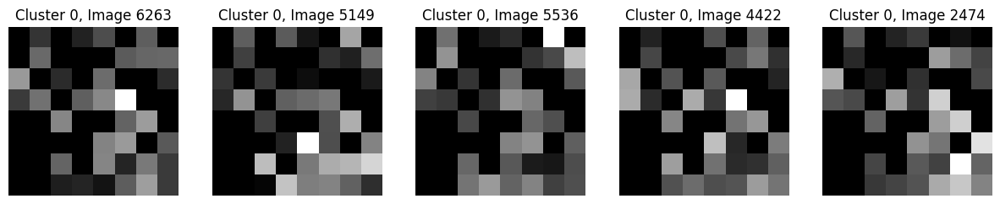

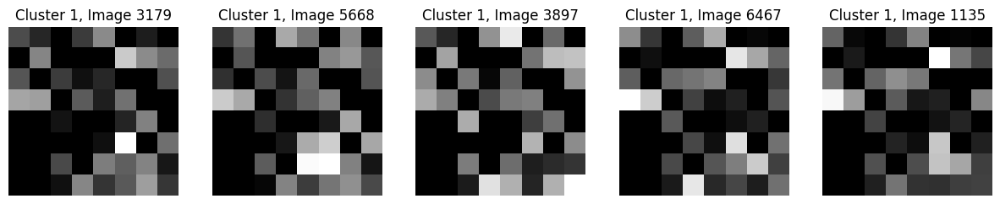

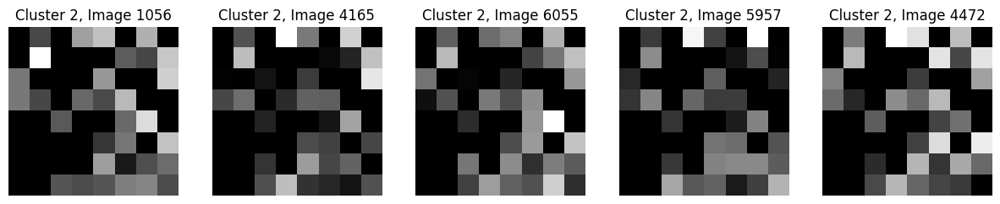

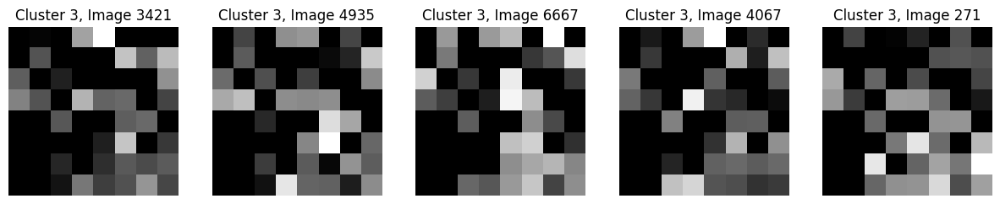

In [ ]:
# Function to plot images from a specific cluster
def plot_cluster_images(cluster_id, encoded_images, cluster_assignments, num_images=5):
    cluster_indices = np.where(cluster_assignments == cluster_id)[0]
    sample_indices = np.random.choice(cluster_indices, size=num_images, replace=False)

    plt.figure(figsize=(15, 3))
    for i, index in enumerate(sample_indices):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(encoded_images[index].reshape((8, 8)), cmap='gray')  # Display grayscale image
        plt.title(f'Cluster {cluster_id}, Image {index}')
        plt.axis('off')
    plt.show()

# Visualize 5 encoded images in each cluster
for cluster_id in range(num_clusters):
    plot_cluster_images(cluster_id, encoded_images_subsampled, cluster_assignments)


In [ ]:
decoded_centroids = decoder.predict(kmeans.cluster_centers_)


1/1 [==============================] - 0s 286ms/step


In [ ]:
reconstructed_images = decoder.predict(encoded_images_subsampled)


235/235 [==============================] - 1s 5ms/step


1/1 [==============================] - 0s 16ms/step


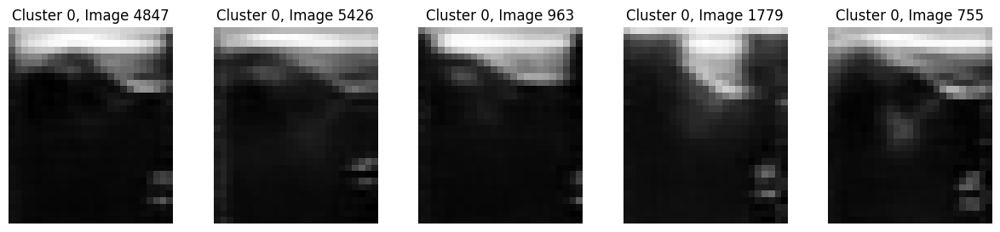

1/1 [==============================] - 0s 16ms/step


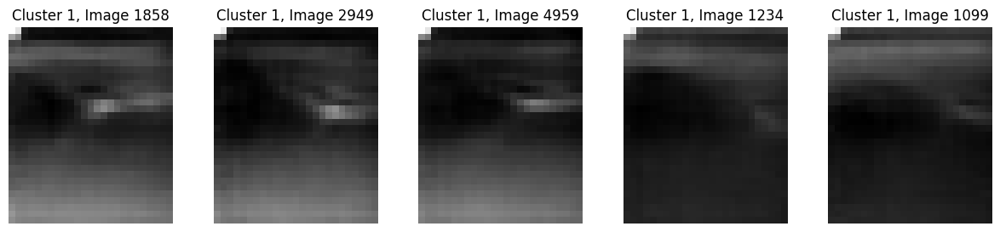

1/1 [==============================] - 0s 16ms/step


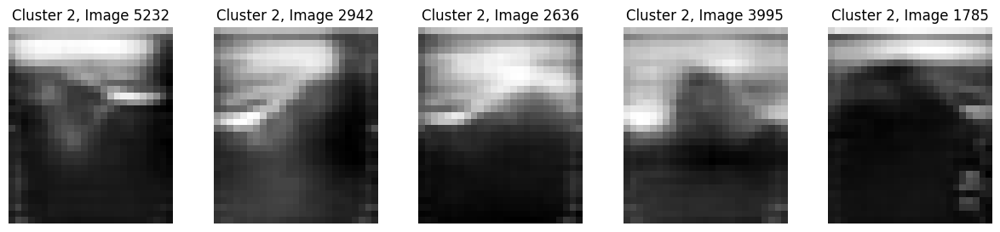

1/1 [==============================] - 0s 16ms/step


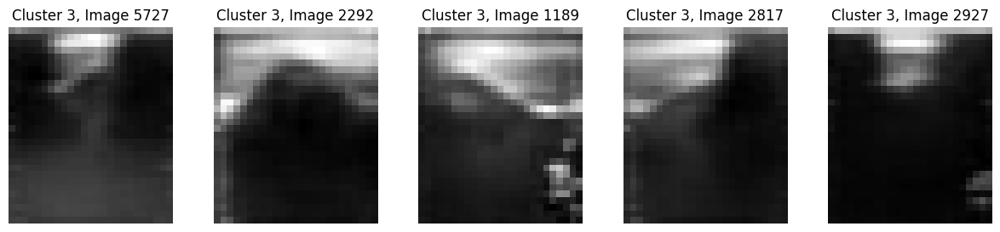

In [ ]:
import matplotlib.pyplot as plt

def plot_cluster_decoded_images(cluster_id, encoded_images, cluster_assignments, decoder, num_images=5):
    cluster_indices = np.where(cluster_assignments == cluster_id)[0]
    sample_indices = np.random.choice(cluster_indices, size=num_images, replace=False)

    plt.figure(figsize=(15, 3))
    for i, index in enumerate(sample_indices):
        plt.subplot(1, num_images, i + 1)

        # Decode the encoded representation
        decoded_image = decoder.predict(encoded_images[index].reshape(1, -1))

        # Assuming decoded_image is a flattened representation
        original_shape = (30, 25, 1)
        decoded_image = decoded_image.reshape(original_shape)

        # Convert to grayscale
        grayscale_image = decoded_image.squeeze(axis=-1)  # Remove singleton channel axis

        plt.imshow(grayscale_image, cmap='gray')  # Use 'gray' colormap for grayscale
        plt.title(f'Cluster {cluster_id}, Image {index}')
        plt.axis('off')
    plt.show()

# Visualize 5 decoded grayscale images in each cluster
for cluster_id in range(num_clusters):
    plot_cluster_decoded_images(cluster_id, encoded_images_subsampled, cluster_assignments, decoder)


SILHOUETTE SCORE FOR DBSCAN CLUSTERING

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Load the encoded images
encoded_images_dbscan = np.load(encoded_file_path)

# Range of min_samples and eps values to try
min_samples_values = list(range(8, 17))
eps_values = np.linspace(0.1, 1.2, 12)

best_silhouette = 0.0
best_min_samples = 0
best_eps = 0.0
best_num_clusters = 0

for min_samples in min_samples_values:
    for eps in eps_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_assignments_dbscan = dbscan.fit_predict(encoded_images_dbscan)

        # Check the number of clusters
        num_clusters = len(set(cluster_assignments_dbscan)) - (1 if -1 in cluster_assignments_dbscan else 0)

        # Skip cases where there are less than 2 clusters
        if num_clusters <= 2:
            continue

        # Calculate silhouette score
        silhouette = silhouette_score(encoded_images_dbscan, cluster_assignments_dbscan)
        print(f"Min Samples: {min_samples}, Eps: {eps:.2f}, "
              f"Number of Clusters: {num_clusters}, "
              f"Silhouette Score: {silhouette}")

        if silhouette > best_silhouette:
            print("Better silhouette score found!")
            best_silhouette = silhouette
            best_min_samples = min_samples
            best_eps = eps
            best_num_clusters = num_clusters

# Print the best parameters found
print(f"Best Min Samples: {best_min_samples}, "
      f"Best Eps: {best_eps:.2f}, "
      f"Best Number of Clusters: {best_num_clusters}, "
      f"Best Silhouette Score: {best_silhouette}")


Min Samples: 8, Eps: 0.30, Number of Clusters: 3, Silhouette Score: -0.04499232769012451
Min Samples: 8, Eps: 0.50, Number of Clusters: 5, Silhouette Score: -0.13981381058692932
Min Samples: 8, Eps: 0.60, Number of Clusters: 21, Silhouette Score: -0.14446797966957092
Min Samples: 8, Eps: 0.70, Number of Clusters: 11, Silhouette Score: -0.1873723715543747
Min Samples: 8, Eps: 0.80, Number of Clusters: 8, Silhouette Score: -0.07895437628030777
Min Samples: 8, Eps: 0.90, Number of Clusters: 6, Silhouette Score: 0.03191637620329857
Better silhouette score found!
Min Samples: 8, Eps: 1.00, Number of Clusters: 6, Silhouette Score: 0.07114703953266144
Better silhouette score found!
Min Samples: 8, Eps: 1.10, Number of Clusters: 3, Silhouette Score: 0.19065123796463013
Better silhouette score found!
Min Samples: 8, Eps: 1.20, Number of Clusters: 3, Silhouette Score: 0.21936482191085815
Better silhouette score found!
Min Samples: 9, Eps: 0.30, Number of Clusters: 3, Silhouette Score: -0.0609325

DBSCAN CLUSTERING

In [ ]:
# Load the encoded images
encoded_images_dbscan = np.load(encoded_file_path)

# Set DBSCAN parameters
eps = best_eps  # The maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = best_min_samples  # The number of samples in a neighborhood for a point to be considered as a core point

# Initialize DBSCAN model
dbscan = DBSCAN(eps=eps, min_samples=min_samples)

# Fit the DBSCAN model to the encoded images
cluster_assignments_dbscan = dbscan.fit_predict(encoded_images_dbscan)

# Number of clusters (excluding noise points)
num_clusters = len(set(cluster_assignments_dbscan)) - (1 if -1 in cluster_assignments_dbscan else 0)
print("Number of Clusters:", num_clusters)



Number of Clusters: 3


TSNE 2D VISUALISATION OF ENCODED IMAGES WITH DBSCAN

In [ ]:
# Function to visualize 2D t-SNE plot using Plotly with custom color mapping
def visualize_tsne_2d_dbscan(data, cluster_labels, title, perplexity_value):
    tsne = TSNE(n_components=2, perplexity=perplexity_value, random_state=42)
    embedded_data = tsne.fit_transform(data)

    # Create a DataFrame for Plotly
    df = pd.DataFrame(data=embedded_data, columns=['T-SNE Dimension 1', 'T-SNE Dimension 2'])
    df['Cluster Labels'] = cluster_labels

    # Plot 2D scatter plot using Plotly with custom color mapping
    fig = px.scatter(df, x='T-SNE Dimension 1', y='T-SNE Dimension 2',
                     color='Cluster Labels', opacity=0.5, title=f"{title} (Perplexity={perplexity_value})",
                     color_continuous_scale=px.colors.qualitative.Set1)  # You can choose a different color scale

    fig.show()

In [ ]:
# Load the encoded images
encoded_images_dbscan = np.load(encoded_file_path)

# Subsample to 7500 points
subsampled_indices = np.random.choice(encoded_images_dbscan.shape[0], size=7500, replace=False)
encoded_images_subsampled_dbscan = encoded_images_dbscan[subsampled_indices]

# Set DBSCAN parameters
eps = best_eps # The maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = best_min_samples  # The number of samples in a neighborhood for a point to be considered as a core point

# Initialize DBSCAN model
dbscan = DBSCAN(eps=eps, min_samples=min_samples)

# Fit the DBSCAN model to the subsampled encoded images
cluster_assignments_dbscan = dbscan.fit_predict(encoded_images_subsampled_dbscan)

# Number of clusters (excluding noise points)
num_clusters = len(set(cluster_assignments_dbscan)) - (1 if -1 in cluster_assignments_dbscan else 0)
print("Number of Clusters:", num_clusters)

Number of Clusters: 3


In [ ]:
perplexity_values = [5, 15, 20, 30, 52, 77, 92]

In [ ]:
# Visualize 2D t-SNE plot for DBSCAN clustering using Plotly
for perplexity in perplexity_values:
    visualize_tsne_2d_dbscan(encoded_images_subsampled_dbscan, cluster_assignments_dbscan, "t-SNE Visualization for DBSCAN", perplexity_value=perplexity)

TSNE 3D VISUALISATION OF ENCODED IMAGES DBSCAN

In [ ]:
# Function to visualize 3D t-SNE plot using Plotly with more colors
def visualize_tsne_3d_dbscan(data, cluster_labels, title, perplexity_value):
    tsne = TSNE(n_components=3, perplexity=perplexity_value, random_state=42)
    embedded_data = tsne.fit_transform(data)

    # Create a DataFrame for Plotly
    df = pd.DataFrame(data=embedded_data, columns=['T-SNE Dimension 1', 'T-SNE Dimension 2', 'T-SNE Dimension 3'])
    df['Cluster Labels'] = cluster_labels.astype(str)  # Convert cluster labels to string to avoid automatic color scaling

    # Plot 3D scatter plot using Plotly with more colors
    fig = px.scatter_3d(df, x='T-SNE Dimension 1', y='T-SNE Dimension 2', z='T-SNE Dimension 3',
                        color='Cluster Labels', opacity=0.5, title=f"{title} (Perplexity={perplexity_value})",
                        color_discrete_sequence=px.colors.qualitative.Set1)  # Change the color scale

    fig.update_layout(scene=dict(xaxis_title='T-SNE Dimension 1', yaxis_title='T-SNE Dimension 2', zaxis_title='T-SNE Dimension 3'))
    fig.show()

In [ ]:
# Load the encoded images
encoded_images_dbscan = np.load(encoded_file_path)

# Subsample to 9500 points
subsampled_indices = np.random.choice(encoded_images_dbscan.shape[0], size=7500, replace=False)
encoded_images_subsampled_dbscan = encoded_images_dbscan[subsampled_indices]

# Set DBSCAN parameters
eps = best_eps # The maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = best_min_samples # The number of samples in a neighborhood for a point to be considered as a core point

# Initialize DBSCAN model
dbscan = DBSCAN(eps=eps, min_samples=min_samples)

# Fit the DBSCAN model to the subsampled encoded images
cluster_assignments_dbscan = dbscan.fit_predict(encoded_images_subsampled_dbscan)

# Number of clusters (excluding noise points)
num_clusters = len(set(cluster_assignments_dbscan)) - (1 if -1 in cluster_assignments_dbscan else 0)
print("Number of Clusters:", num_clusters)

Number of Clusters: 3


In [ ]:
perplexity_values = [5, 15, 20, 30, 52, 77, 92]

In [ ]:
# Visualize 3D t-SNE plot for DBSCAN clustering using Plotly
for perplexity in perplexity_values:
    visualize_tsne_3d_dbscan(encoded_images_subsampled_dbscan, cluster_assignments_dbscan, "t-SNE Visualization for DBSCAN Clustering", perplexity_value=perplexity)

PLOTTING IMAGE FROM EVERY CLUSTER DBSCAN

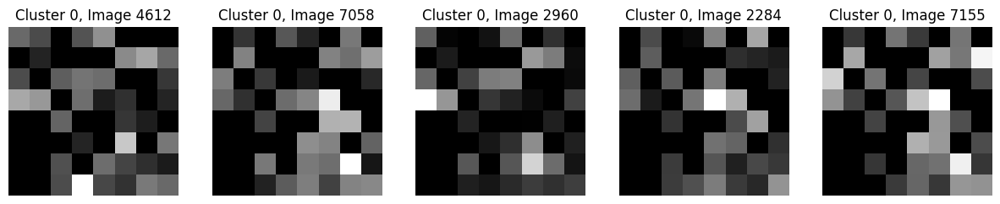

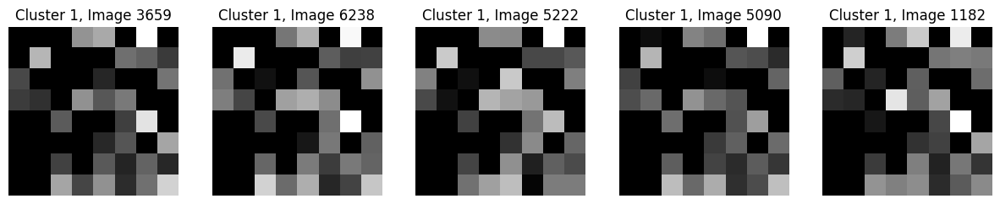

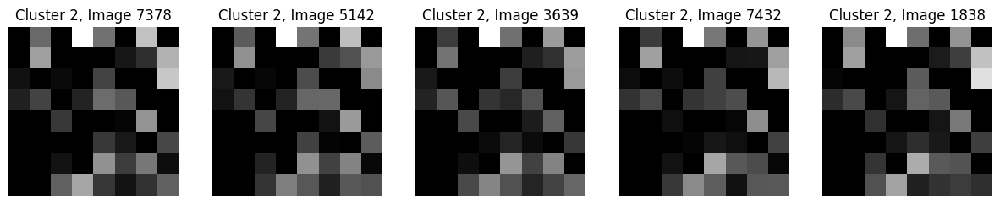

In [ ]:
# Function to plot images from a specific cluster
def plot_cluster_images_dbscan(cluster_id, encoded_images, cluster_assignments, num_images=5):
    cluster_indices = np.where(cluster_assignments == cluster_id)[0]
    sample_indices = np.random.choice(cluster_indices, size=min(num_images, len(cluster_indices)), replace=False)

    plt.figure(figsize=(15, 3))
    for i, index in enumerate(sample_indices):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(encoded_images[index].reshape((8, 8)))  # Adjust the shape accordingly
        plt.title(f'Cluster {cluster_id}, Image {index}')
        plt.axis('off')
    plt.show()

# Load the encoded images
encoded_images_dbscan = np.load(encoded_file_path)

# Subsample to 9500 points
subsampled_indices = np.random.choice(encoded_images_dbscan.shape[0], size=7500, replace=False)
encoded_images_subsampled_dbscan = encoded_images_dbscan[subsampled_indices]

# Set DBSCAN parameters
eps = best_eps  # The maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = best_min_samples # The number of samples in a neighborhood for a point to be considered as a core point

# Initialize DBSCAN model
dbscan = DBSCAN(eps=eps, min_samples=min_samples)

# Fit the DBSCAN model to the subsampled encoded images
cluster_assignments_dbscan = dbscan.fit_predict(encoded_images_subsampled_dbscan)

# Number of clusters (excluding noise points)
num_clusters = len(set(cluster_assignments_dbscan)) - (1 if -1 in cluster_assignments_dbscan else 0)

# Visualize 5 encoded images in each cluster
for cluster_id in range(num_clusters):
    plot_cluster_images(cluster_id, encoded_images_subsampled_dbscan, cluster_assignments_dbscan)


In [ ]:
# Assuming decoded_centroids_dbscan is the centroids obtained using DBSCAN
decoded_centroids_dbscan = decoder.predict(encoded_images_dbscan)

239/239 [==============================] - 1s 5ms/step


1/1 [==============================] - 0s 90ms/step


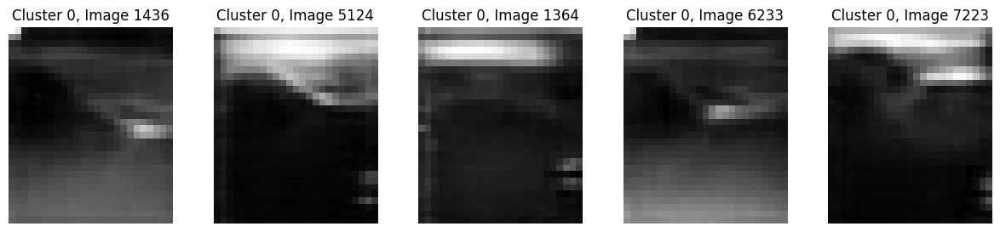

1/1 [==============================] - 0s 16ms/step


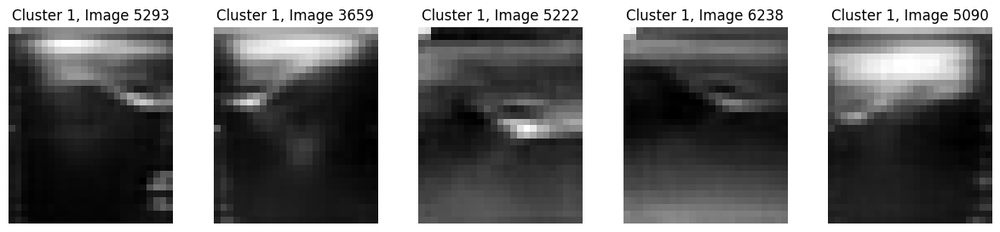

1/1 [==============================] - 0s 17ms/step


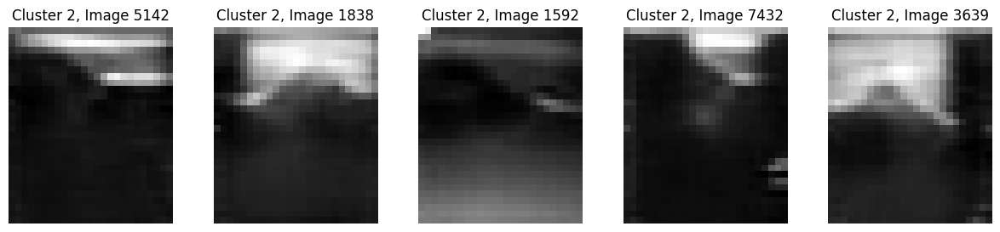

In [ ]:
# Function to plot images from a specific cluster
def plot_cluster_decoded_images(cluster_id, encoded_images, cluster_assignments, decoder, num_images=5):
    cluster_indices = np.where(cluster_assignments == cluster_id)[0]
    sample_indices = np.random.choice(cluster_indices, size=num_images, replace=False)

    plt.figure(figsize=(15, 3))
    for i, index in enumerate(sample_indices):
        plt.subplot(1, num_images, i + 1)

        # Decode the encoded representation
        if cluster_id == -1:
            decoded_image = decoded_centroids_dbscan[0].reshape(1, -1)  # Use the first cluster for noise points
        else:
            decoded_image = decoder.predict(encoded_images_dbscan[index].reshape(1, -1))

        # Assuming decoded_image is a flattened representation
        original_shape = (30, 25, 1)
        decoded_image = decoded_image.reshape(original_shape)

        # Convert to grayscale
        grayscale_image = decoded_image.squeeze(axis=-1)  # Remove singleton channel axis

        plt.imshow(grayscale_image, cmap='gray')  # Use 'gray' colormap for grayscale
        plt.title(f'Cluster {cluster_id}, Image {index}')
        plt.axis('off')
    plt.show()

# Visualize 5 decoded grayscale images in each cluster
for cluster_id in range(num_clusters):
    plot_cluster_decoded_images(cluster_id, encoded_images_dbscan, cluster_assignments_dbscan, decoder)


CHECKING IMAGES WITH ASSIGNED TO -1 CLUSTER

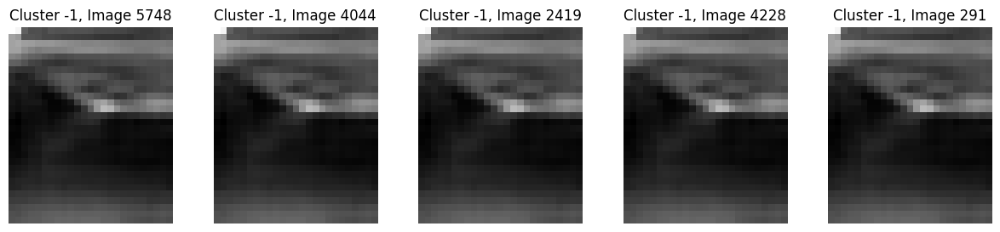

In [ ]:
# Function to plot images from a specific cluster
def plot_cluster_decoded_images(cluster_id, encoded_images, cluster_assignments, decoder, decoded_centroids, num_images=5):
    cluster_indices = np.where(cluster_assignments == cluster_id)[0]

    # If cluster_id is -1 (noise points), include all noise points
    if cluster_id == -1:
        noise_indices = np.where(cluster_assignments == -1)[0]
        sample_indices = np.random.choice(noise_indices, size=min(num_images, len(noise_indices)), replace=False)
    else:
        # If cluster_id is not -1, randomly sample from the specific cluster
        sample_indices = np.random.choice(cluster_indices, size=min(num_images, len(cluster_indices)), replace=False)

    plt.figure(figsize=(15, 3))
    for i, index in enumerate(sample_indices):
        plt.subplot(1, num_images, i + 1)

        # Decode the encoded representation
        if cluster_id == -1:
            decoded_image = decoded_centroids[0].reshape(1, -1)  # Use the first cluster for noise points
        else:
            decoded_image = decoder.predict(encoded_images[index].reshape(1, -1))

        # Assuming decoded_image is a flattened representation
        original_shape = (30, 25, 1)
        decoded_image = decoded_image.reshape(original_shape)

        # Convert to grayscale
        grayscale_image = decoded_image.squeeze(axis=-1)  # Remove singleton channel axis

        plt.imshow(grayscale_image, cmap='gray')  # Use 'gray' colormap for grayscale
        plt.title(f'Cluster {cluster_id}, Image {index}')
        plt.axis('off')
    plt.show()

# Visualize 5 decoded grayscale images in cluster -1 (noise points)
plot_cluster_decoded_images(-1, encoded_images_dbscan, cluster_assignments_dbscan, decoder, decoded_centroids_dbscan)


TRAINING AUTOENCODER ON THE ENTIRE DATASET


In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [ ]:
# Loading the data
images = np.load('/content/new_data/images.npy')

In [ ]:
images = images.astype('float32') / 255.0

In [ ]:
# Flattening the data if needed
images_flat = images.reshape((len(images), -1))

In [ ]:
# Defining your autoencoder model
autoencoder = Sequential()

In [ ]:
# Predefined latent size
LATENT_SIZE = 64

In [ ]:
# Encoder
encoder = Sequential([
    Conv2D(128, (3, 3), activation='relu', padding='same', input_shape=(30, 25, 1)),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    Flatten(),
    Dense(LATENT_SIZE, activation='relu')
])

# Decoder
decoder = Sequential([
    Dense(1200, activation='relu', input_shape=(LATENT_SIZE,)),
    Reshape((4, 5, 60)),
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(1, (3, 3), activation='sigmoid', padding='same'),
    Lambda(lambda x: x[:, :30, :25, :])
])


In [ ]:
# Combine encoder and decoder to create the autoencoder
autoencoder = Sequential([encoder, decoder])

In [ ]:
# Compile the model
autoencoder.compile(optimizer='adam', loss='mse')

In [ ]:
plot_losses = PlotLossesKeras()

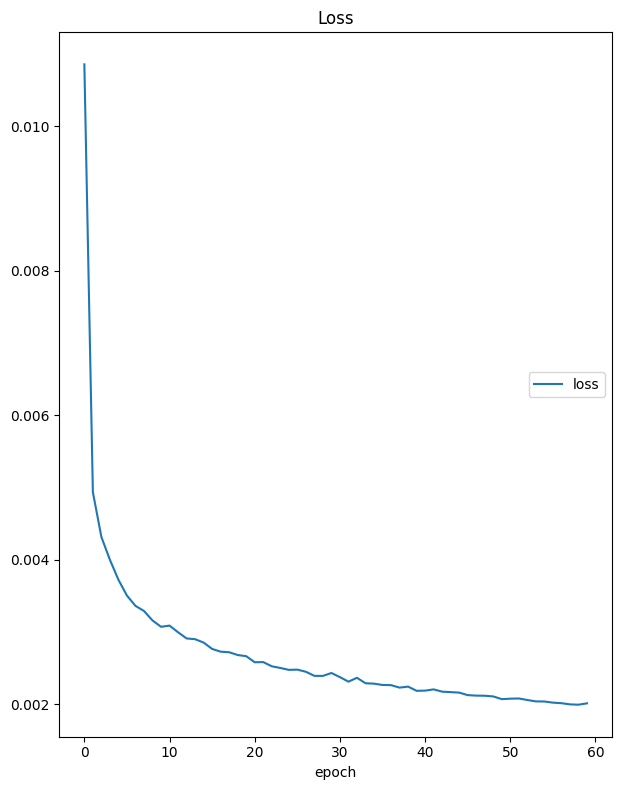

Loss
	loss             	 (min:    0.002, max:    0.011, cur:    0.002)
298/298 [==============================] - 5s 17ms/step - loss: 0.0020


In [ ]:
# Train the autoencoder
autoencoder.fit(images, images, epochs=60, callbacks=[plot_losses])

In [ ]:
# Use the trained autoencoder to encode and decode data
encoded_images = encoder.predict(images)
decoded_images = decoder.predict(encoded_images)


298/298 [==============================] - 1s 5ms/step


1/1 [==============================] - 0s 253ms/step


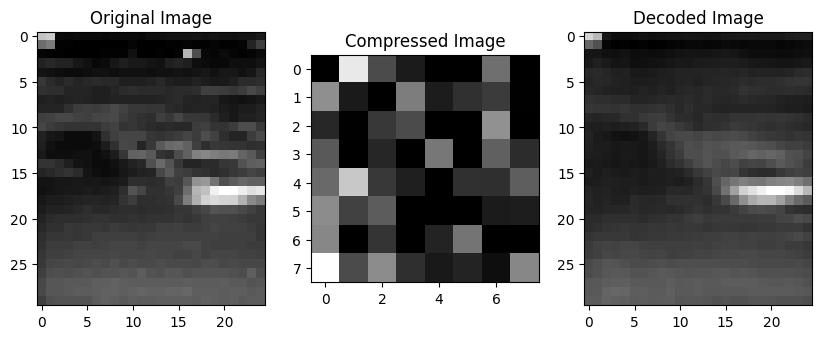

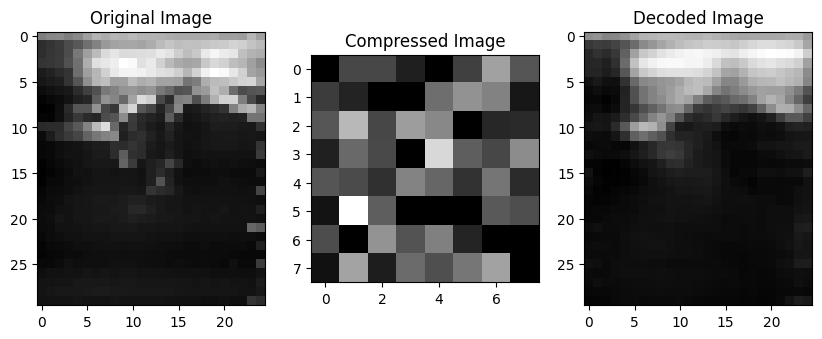

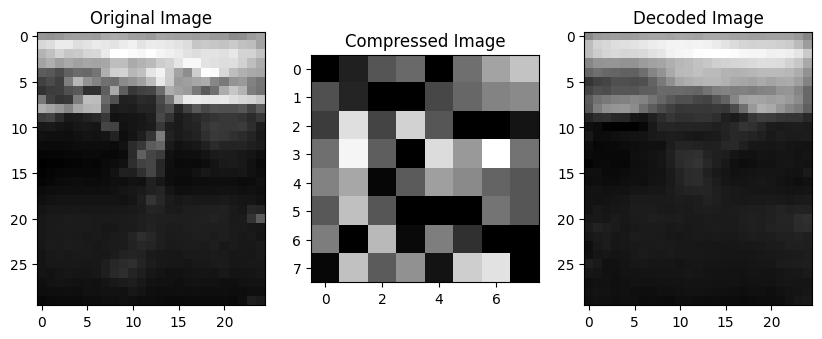

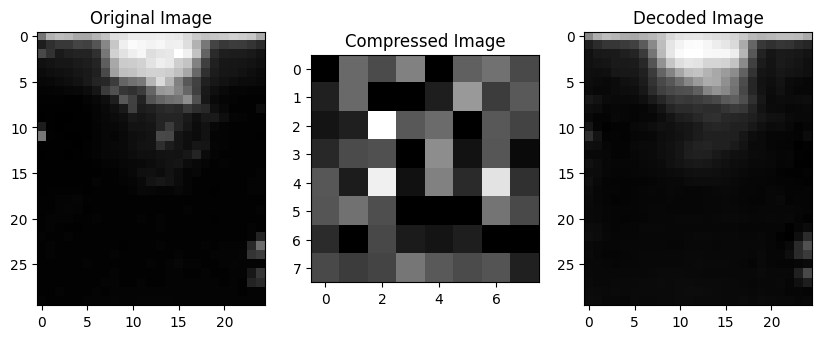

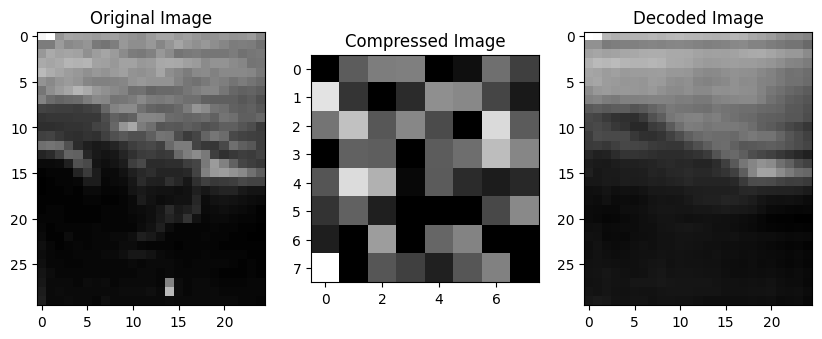

In [ ]:
# Make sure len(images) is greater than num_examples
num_examples = 5
random_indices = np.random.randint(0, len(images), size=num_examples)

# Use the trained autoencoder to encode and decode the selected examples
encoded_images = encoder.predict(images[random_indices])
decoded_images = decoder.predict(encoded_images)

# Plot the original, compressed, and decoded images
for i in range(num_examples):
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(images[random_indices[i]].squeeze(), cmap='gray')
    plt.title('Original Image')

    # Compressed Image
    plt.subplot(1, 3, 2)
    plt.imshow(encoded_images[i].reshape((8, 8)).squeeze(), cmap='gray')
    plt.title('Compressed Image')

    # Decoded Image
    plt.subplot(1, 3, 3)
    plt.imshow(decoded_images[i].squeeze(), cmap='gray')
    plt.title('Decoded Image')

    plt.show()


TRAINING AUTOENCODER ON THE ENTIRE DATASET USING CATEGORICAL_CROSSENTROPY

In [ ]:
# Loading the data
images = np.load('/content/new_data/images.npy')

In [ ]:
images = images.astype('float32') / 255.0

In [ ]:
# Flattening the data if needed
images_flat = images.reshape((len(images), -1))

In [ ]:
# Defining your autoencoder model
autoencoder = Sequential()

In [ ]:
# Predefined latent size
LATENT_SIZE = 64

In [ ]:
# Encoder
encodercc = Sequential([
    Conv2D(128, (3, 3), activation='relu', padding='same', input_shape=(30, 25, 1)),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2), padding='same'),
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    Flatten(),
    Dense(LATENT_SIZE, activation='relu')
])

# Decoder
decodercc = Sequential([
    Dense(1200, activation='relu', input_shape=(LATENT_SIZE,)),
    Reshape((4, 5, 60)),
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    UpSampling2D((2, 2)),
    Conv2D(1, (3, 3), activation='sigmoid', padding='same'),
    Lambda(lambda x: x[:, :30, :25, :])
])


In [ ]:
# Combine encoder and decoder to create the autoencoder
autoencoder = Sequential([encodercc, decodercc])

In [ ]:
# Compile the model
autoencoder.compile(optimizer='adam', loss='categorical_crossentropy')

In [ ]:
plot_losses = PlotLossesKeras()

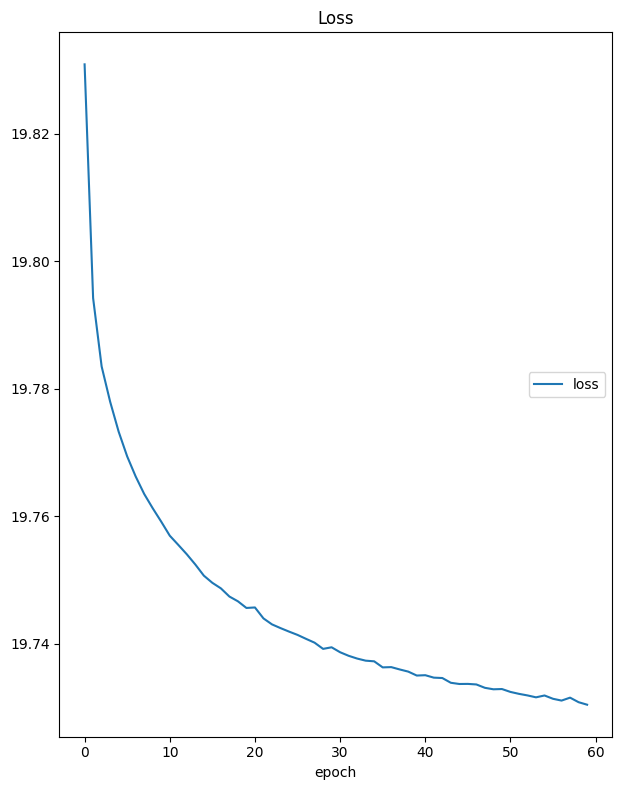

Loss
	loss             	 (min:   19.730, max:   19.831, cur:   19.730)
298/298 [==============================] - 5s 17ms/step - loss: 19.7305


In [ ]:
# Train the autoencoder
autoencoder.fit(images, images, epochs=60, callbacks=[plot_losses])

In [ ]:
# Use the trained autoencoder to encode and decode data
encoded_images = encodercc.predict(images)
decoded_images = decodercc.predict(encoded_images)


298/298 [==============================] - 1s 5ms/step


In [ ]:
print(encoded_images.shape)

(9529, 64)


In [ ]:
print(decoded_images.shape)

(9529, 30, 25, 1)


1/1 [==============================] - 0s 16ms/step


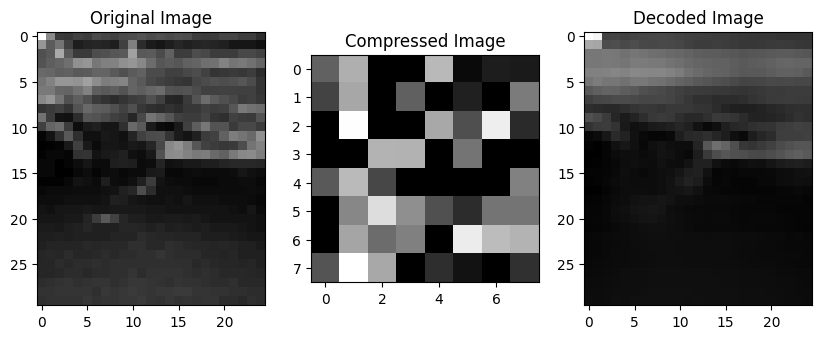

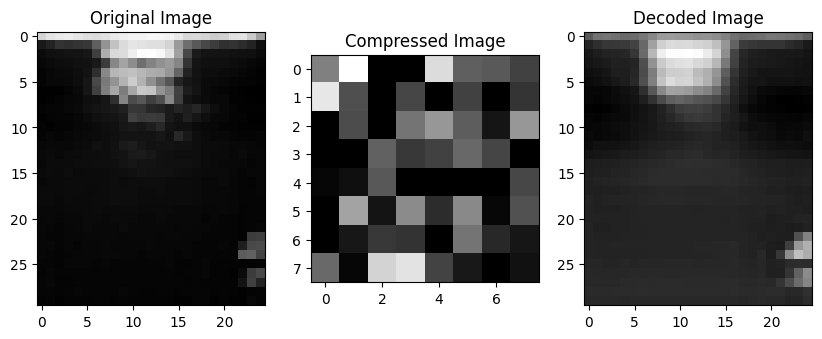

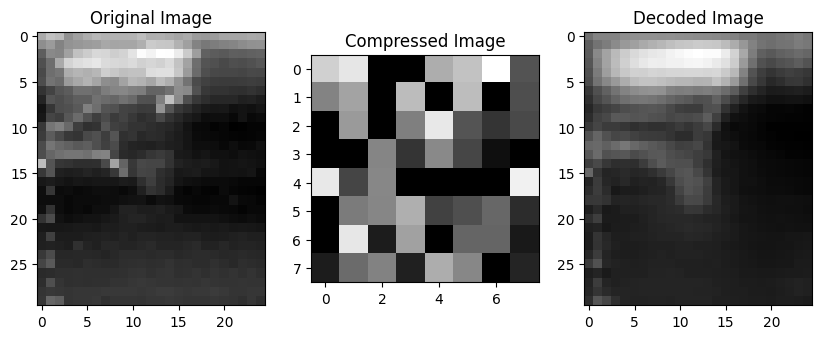

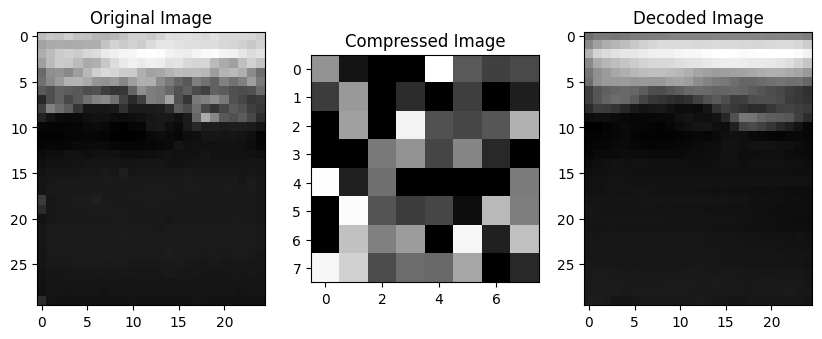

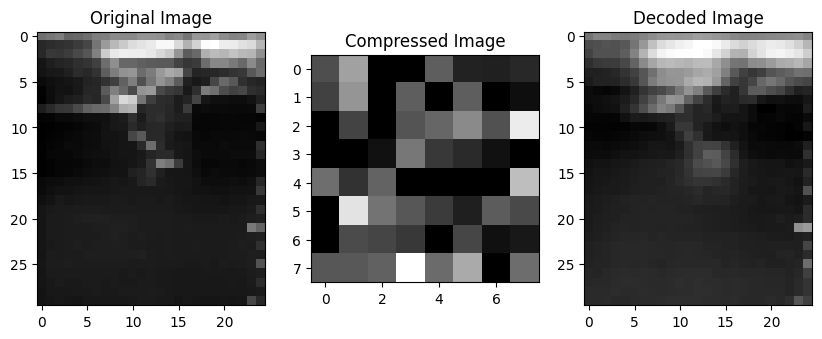

In [ ]:
# Make sure len(images) is greater than num_examples
num_examples = 5
random_indices = np.random.randint(0, len(images), size=num_examples)

# Use the trained autoencoder to encode and decode the selected examples
encoded_images = encodercc.predict(images[random_indices])
decoded_images = decodercc.predict(encoded_images)

# Plot the original, compressed, and decoded images
for i in range(num_examples):
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(images[random_indices[i]].squeeze(), cmap='gray')
    plt.title('Original Image')

    # Compressed Image
    plt.subplot(1, 3, 2)
    plt.imshow(encoded_images[i].reshape((8, 8)).squeeze(), cmap='gray')
    plt.title('Compressed Image')

    # Decoded Image
    plt.subplot(1, 3, 3)
    plt.imshow(decoded_images[i].squeeze(), cmap='gray')
    plt.title('Decoded Image')

    plt.show()
